From https://medium.com/m2mtechconnect/classifying-music-and-speech-with-machine-learning-e036ffab002e

In [1]:
import numpy as np
import pandas as pd
import os
import pathlib
import matplotlib.pyplot as plt
import seaborn as sns
from IPython import display
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras import layers, regularizers
from tensorflow.keras import models
#import tensorflow_datasets as tfds

In [2]:
import ffmpeg
from pydub import AudioSegment

In [3]:
#data_dir = pathlib.Path('/root/tensorflow_datasets/downloads/extracted/TAR_GZ.opihi.cs.uvic.ca_sound_music_speechbya81rFcWfLSW6ey5cynqyeq2qiePcL-7asMoNO6IQ0.tar.gz/music_speech')
data_dir   = 'birds'
categories = np.array(tf.io.gfile.listdir(data_dir))
categories = [category for category in categories if 'wav' not in category]
categories

['Common Moorhen',
 'Eurasian Oystercatcher',
 'European Nightjar',
 'Marsh Tit',
 'Redwing']

In [4]:
AudioSegment.ffprobe  = "/usr/local/bin/ffmpeg"

In [5]:
#wav_check = 'birds'
#labels = os.listdir(wav_check)
#for lab in labels:
#    for sound_f in os.listdir(wav_check+'/'+lab):
#        pre, ext = os.path.splitext(wav_check+'/'+lab+'/'+sound_f)
#        if ext == '.wav':
#            continue
#        s_temp   = AudioSegment.from_file(pre+ext, ext[1:])
#        s_temp.export(pre+'.wav', format="wav")

In [6]:
#import re
#wav_check = 'birds'
#labels = os.listdir(wav_check)
#for lab in labels:
#    dirname = wav_check+'/'+lab
#    for sound_f in os.listdir(dirname):
#        if re.search('.wav', sound_f) == None:
#            os.remove(os.path.join(dirname, sound_f))

In [7]:
def get_waveform_and_label(file_path):
    label = get_label(file_path)
    audio_binary = tf.io.read_file(file_path)
    waveform = decode_audio(audio_binary)
    return waveform, label

In [8]:
def get_label(file_path):
    parts = tf.strings.split(file_path, os.path.sep)

    # Note: You'll use indexing here instead of tuple unpacking to enable this 
    # to work in a TensorFlow graph.
    return parts[-2]

In [9]:
def decode_audio(audio_binary):
    audio, _ = tf.audio.decode_wav(audio_binary) # returns the WAV-encoded audio as a tensor and the sample rate
    #return tf.squeeze(audio, axis=-1) # removes dimensions of size 1 from the last axis
    return audio[:,0]

In [10]:
filenames = tf.io.gfile.glob(str(data_dir) + '/*/*')
#filenames = tf.io.gfile.glob('birds/*/*')
filenames = [filename for filename in filenames if 'wav' in filename]
filenames = tf.random.shuffle(filenames)

In [11]:
filenames

<tf.Tensor: shape=(500,), dtype=string, numpy=
array([b'birds\\European Nightjar\\xc448447.wav',
       b'birds\\Redwing\\xc528726.wav', b'birds\\Redwing\\xc543319.wav',
       b'birds\\Marsh Tit\\xc457105.wav',
       b'birds\\European Nightjar\\xc483258.wav',
       b'birds\\European Nightjar\\xc317282.wav',
       b'birds\\Redwing\\xc600484.wav', b'birds\\Marsh Tit\\xc559277.wav',
       b'birds\\Common Moorhen\\xc466994.wav',
       b'birds\\Common Moorhen\\xc564468.wav',
       b'birds\\European Nightjar\\xc481982.wav',
       b'birds\\Common Moorhen\\xc487692.wav',
       b'birds\\Marsh Tit\\xc440449.wav', b'birds\\Redwing\\xc552392.wav',
       b'birds\\Redwing\\xc535709.wav', b'birds\\Marsh Tit\\xc469805.wav',
       b'birds\\Marsh Tit\\xc478196.wav',
       b'birds\\Eurasian Oystercatcher\\xc462741.wav',
       b'birds\\Eurasian Oystercatcher\\xc317477.wav',
       b'birds\\Common Moorhen\\xc410962.wav',
       b'birds\\Redwing\\xc601929.wav', b'birds\\Redwing\\xc600969.wav',


In [12]:
num_samples = len(filenames)
print('Number of total examples:', num_samples)
print('Number of examples per label:',
      len(tf.io.gfile.listdir(str(pathlib.Path('birds')/categories[0]))))
print('Example file tensor:', filenames[0])

Number of total examples: 500
Number of examples per label: 100
Example file tensor: tf.Tensor(b'birds\\European Nightjar\\xc448447.wav', shape=(), dtype=string)


In [13]:
TRAIN_SIZE = 0.8

cutoff = int(len(filenames) * TRAIN_SIZE)
train_files = filenames[:cutoff]
test_files  = filenames[cutoff:]

print('Training set size:', len(train_files))
print('Validation set size:', len(test_files))

Training set size: 400
Validation set size: 100


In [14]:
AUTOTUNE    = tf.data.experimental.AUTOTUNE
files_ds    = tf.data.Dataset.from_tensor_slices(train_files)
waveform_ds = files_ds.map(get_waveform_and_label, num_parallel_calls=AUTOTUNE)

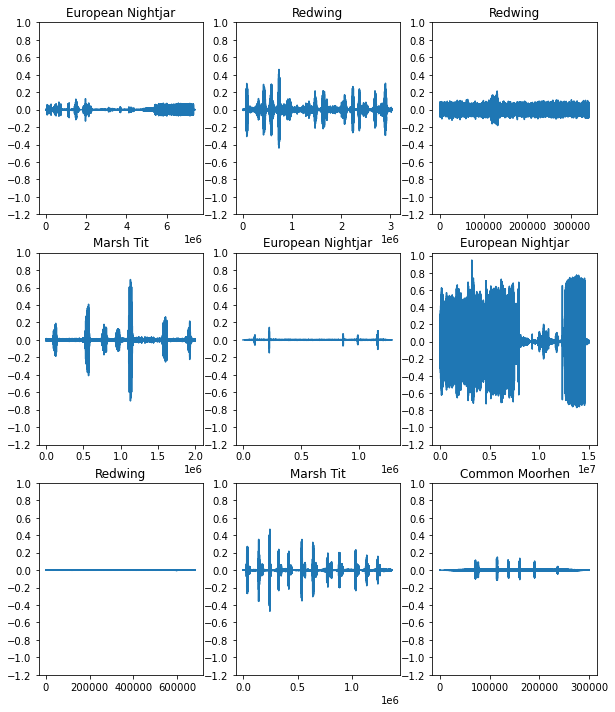

In [15]:
rows = 3
cols = 3
n    = rows*cols
fig, axes = plt.subplots(rows, cols, figsize=(10, 12))
for i, (audio, label) in enumerate(waveform_ds.take(n)):
    r = i // cols
    c = i % cols
    ax = axes[r][c]
    ax.plot(audio.numpy())
    ax.set_yticks(np.arange(-1.2, 1.2, 0.2))
    label = label.numpy().decode('utf-8')
    ax.set_title(label)

plt.show()

In [16]:
t_shapes = []
for waveform, label in waveform_ds:
    t_shapes.append(int(tf.shape(waveform)[0]))
max_shape_pad = max(t_shapes)

In [17]:
np.array(t_shapes).mean()

2115801.87

In [18]:
def get_spectrogram(waveform):
    #cutoff spectrogram size to either splice or pad
    pad_cut  = tf.constant([1800, 2*129])
    waveform = tf.cast(waveform, tf.float32)
    
    # produces an array of complex numbers representing magnitude and phase
    spectrogram = tf.signal.stft(
        waveform, frame_length=255, frame_step=128) #frame_step=1 would give spectrogram same length as audio plot

    # removes the phase (we only care about the magnitude)
    spectrogram = tf.abs(spectrogram)
    
    #if length < pad_cut
    ## Concatenate with padding (close to 0) so that all specrograms will be of the same length 
    #else if length > pad_cut
    ## cut off anything in the spectrogram after pad_cut
    zero_padding = tf.cond(tf.shape(spectrogram)[0] > pad_cut[0], 
                          lambda: tf.ones([1,1]), #some basic tensor, won't be used
                          lambda: tf.ones(pad_cut - tf.shape(spectrogram), dtype=tf.float32)*1e-8)
    spectrogram = tf.cond(tf.shape(spectrogram)[0] > pad_cut[0], 
                          lambda: tf.slice(spectrogram, [0,0], [pad_cut[0], 129]), 
                          lambda: tf.concat([spectrogram, zero_padding], 0))

    return spectrogram

In [19]:
for waveform, label in waveform_ds.take(1):
    label = label.numpy().decode('utf-8')
    spectrogram = get_spectrogram(waveform)

print('Label:', label)
print('Waveform shape:', waveform.shape)
print('Spectrogram shape:', spectrogram.shape)
# print('Audio playback')
display.display(display.Audio(waveform, rate=16000))

Label: European Nightjar
Waveform shape: (7417728,)
Spectrogram shape: (1800, 129)


<ipython-input-20-384949d7e711>:4: RuntimeWarning: divide by zero encountered in log
  log_spec = np.log(spectrogram.T)


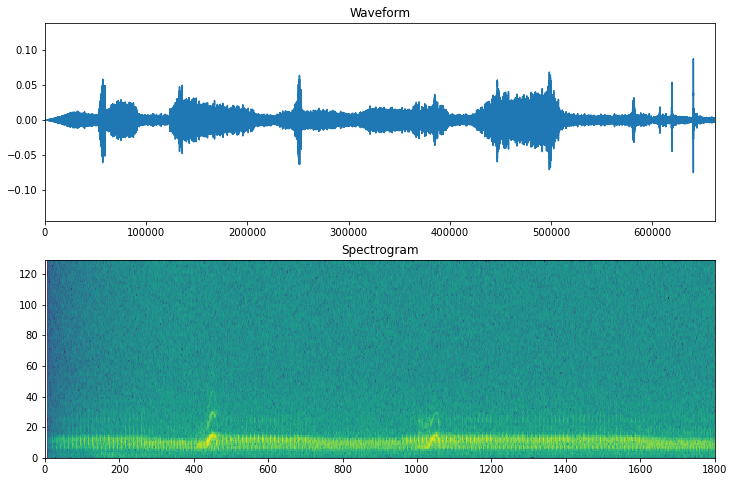

In [20]:
def plot_spectrogram(spectrogram, ax):
    # Convert to frequencies to log scale and transpose so that the time is
    # represented in the x-axis (columns).
    log_spec = np.log(spectrogram.T)
    ax.pcolormesh(log_spec)


fig, axes = plt.subplots(2, figsize=(12, 8))
timescale = np.arange(waveform.shape[0])
axes[0].plot(timescale, waveform.numpy())
axes[0].set_title('Waveform')
axes[0].set_xlim([0, 661500])
plot_spectrogram(spectrogram.numpy(), axes[1])
axes[1].set_title('Spectrogram')
plt.show()

In [21]:
def get_spectrogram_and_label_id(audio, label):
    spectrogram = get_spectrogram(audio)
    spectrogram = tf.expand_dims(spectrogram, -1)
    label_id = tf.argmax(label == categories)
    return spectrogram, label_id

In [22]:
spectrogram_ds = waveform_ds.map(get_spectrogram_and_label_id, num_parallel_calls=AUTOTUNE)

In [23]:
def preprocess_dataset(files):
    files_ds  = tf.data.Dataset.from_tensor_slices(files)
    output_ds = files_ds.map(get_waveform_and_label, num_parallel_calls=AUTOTUNE)
    output_ds = output_ds.map(get_spectrogram_and_label_id,  num_parallel_calls=AUTOTUNE)
    return output_ds

In [24]:
train_ds = spectrogram_ds
test_ds  = preprocess_dataset(test_files)

In [25]:
train_labs = [int(y) for _, y in train_ds]
test_labs  = [int(y) for _, y in test_ds]

In [26]:
train_labs_sort = train_labs
test_labs_sort  = test_labs
train_labs_sort.sort()
test_labs_sort.sort()

Text(0.5, 1.0, 'Test')

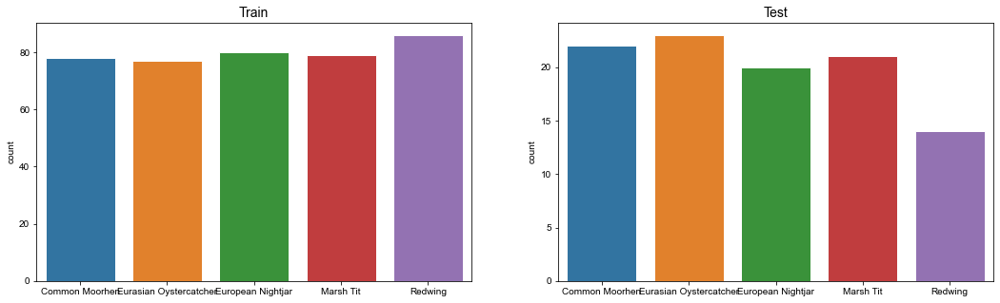

In [27]:
f, axes = plt.subplots(1, 2, figsize = (18,5))
l = []
for i in train_labs_sort:
    l.append(categories[i])
sns.set_style('darkgrid')
sns.countplot(x = l, ax=axes[0])
lb = axes[0].get_xlabel()
axes[0].set_xlabel(lb, fontsize=8)
axes[0].set_title("Train", size = 14)

lt = []
for i in test_labs_sort:
    lt.append(categories[i])
sns.set_style('darkgrid')
sns.countplot(x = lt, ax=axes[1])
lbt = axes[1].get_xlabel()
axes[1].set_xlabel(lbt, fontsize=12)
axes[1].set_title("Test", size = 14)

In [28]:
#test_files

In [29]:
batch_size = 1
train_ds   = train_ds.batch(batch_size)
test_ds    = test_ds.batch(batch_size)
train_ds   = train_ds.cache().prefetch(AUTOTUNE)
test_ds    = test_ds.cache().prefetch(AUTOTUNE)

In [30]:
type(train_ds)

tensorflow.python.data.ops.dataset_ops.PrefetchDataset

In [31]:
for spectrogram, _ in spectrogram_ds.take(1):
    input_shape = spectrogram.shape

print('Input shape:', input_shape)
num_labels = len(categories)

Input shape: (1800, 129, 1)


In [32]:
norm_layer = preprocessing.Normalization()
norm_layer.adapt(spectrogram_ds.map(lambda x, _: x))

In [80]:
model = models.Sequential([
    layers.Input(shape=input_shape),
    preprocessing.Resizing(64, 64), 
    norm_layer,
    layers.Conv2D(16, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(16, 3, activation='relu'),
    layers.MaxPooling2D(),
    #layers.Conv2D(32, 3, activation='relu'),
    #layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dropout(0.5),
    layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    layers.Dropout(0.5),
    layers.Dense(num_labels),
])

model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resizing_3 (Resizing)        (None, 64, 64, 1)         0         
_________________________________________________________________
normalization (Normalization (None, 64, 64, 1)         3         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 62, 62, 16)        160       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 31, 31, 16)        0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 29, 29, 16)        2320      
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 14, 14, 16)        0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 3136)             

In [81]:
model.compile(
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss      = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics   = 'accuracy',
)

In [82]:
EPOCHS = 50
history = model.fit(
    train_ds, 
    validation_data = test_ds,  
    epochs          = EPOCHS,
    #callbacks       = tf.keras.callbacks.EarlyStopping(verbose=1, patience=2)
)

Epoch 1/50
400/400 [==============================] - 2s 4ms/step - loss: 1.7933 - accuracy: 0.2800 - val_loss: 1.4042 - val_accuracy: 0.4400
Epoch 2/50
400/400 [==============================] - 1s 4ms/step - loss: 1.5522 - accuracy: 0.4225 - val_loss: 1.3046 - val_accuracy: 0.5300
Epoch 3/50
400/400 [==============================] - 2s 5ms/step - loss: 1.3973 - accuracy: 0.4775 - val_loss: 1.2337 - val_accuracy: 0.5200
Epoch 4/50
400/400 [==============================] - 2s 5ms/step - loss: 1.3537 - accuracy: 0.5100 - val_loss: 1.1824 - val_accuracy: 0.5800
Epoch 5/50
400/400 [==============================] - 2s 4ms/step - loss: 1.2389 - accuracy: 0.5450 - val_loss: 1.1237 - val_accuracy: 0.6600
Epoch 6/50
400/400 [==============================] - 2s 4ms/step - loss: 1.1487 - accuracy: 0.6125 - val_loss: 1.0929 - val_accuracy: 0.6600
Epoch 7/50
400/400 [==============================] - 2s 4ms/step - loss: 1.1412 - accuracy: 0.5800 - val_loss: 1.0775 - val_accuracy: 0.6400
Epoch 

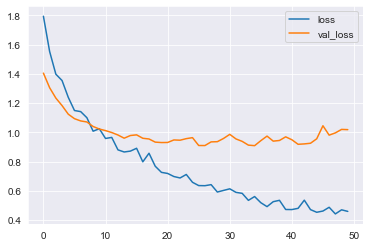

In [83]:
metrics = history.history
plt.plot(history.epoch, metrics['loss'], metrics['val_loss'])
plt.legend(['loss', 'val_loss'])
plt.show()

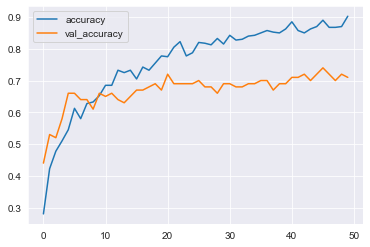

In [84]:
metrics = history.history
plt.plot(history.epoch, metrics['accuracy'], metrics['val_accuracy'])
plt.legend(['accuracy', 'val_accuracy'])
plt.show()

In [85]:
import plotly.graph_objs as go
metrics = history.history

In [86]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = history.epoch, y = metrics['loss'], 
                         mode = 'lines', name = 'Training',
                         line = dict(color='dodgerblue')))
fig.add_trace(go.Scatter(x = history.epoch, y = metrics['val_loss'], 
                         mode = 'lines', name = 'Validation',
                         line = dict(color='orange')))
fig.update_layout(title='Loss Curve',
                   xaxis_title='Epoch',
                   yaxis_title='Loss')

fig.show()

In [87]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = history.epoch, y = metrics['accuracy'], 
                         mode = 'lines', name = 'Training',
                        line = dict(color='dodgerblue')))
fig.add_trace(go.Scatter(x = history.epoch, y = metrics['val_accuracy'], 
                         mode = 'lines', name = 'Validation',
                        line = dict(color='orange')))
fig.update_layout(title='Accuracy Curve',
                   xaxis_title='Epoch',
                   yaxis_title='Accuracy')

fig.show()

In [88]:
model.save('models/shallow_net_cleaned')

INFO:tensorflow:Assets written to: models/shallow_net_cleaned\assets


In [89]:
#todo: confusion matrix and other 
y_pred = np.argmax(model.predict(test_ds), axis=-1)
y_true = [y for _,y in test_ds.unbatch()]

In [90]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_true, y_pred)
cm

array([[13,  2,  3,  1,  3],
       [ 2, 20,  0,  1,  0],
       [ 7,  1, 12,  0,  0],
       [ 1,  0,  0, 19,  1],
       [ 3,  2,  0,  2,  7]], dtype=int64)

In [91]:
from sklearn.metrics import roc_curve, roc_auc_score, auc
y_pred_proba = model.predict_proba(test_ds)[::,1]
#fpr, tpr, _  = roc_curve(y_true,  y_pred_proba)

In [92]:
pred_lists = model.predict_proba(test_ds)

In [93]:
pred_df = pd.DataFrame(pred_lists, columns = categories)

In [94]:
pred_df_softmax = pred_df.apply(lambda x: np.exp(x - np.max(x))/np.exp(x - np.max(x)).sum(), axis=1)

In [95]:
#pred_df_softmax.to_numpy()

In [96]:
from sklearn.preprocessing import OneHotEncoder
onehot_data = OneHotEncoder(sparse=False)
onehot_data = onehot_data.fit_transform(np.array(y_true).reshape(len(y_true),1))

In [97]:
#onehot_data
from itertools import cycle

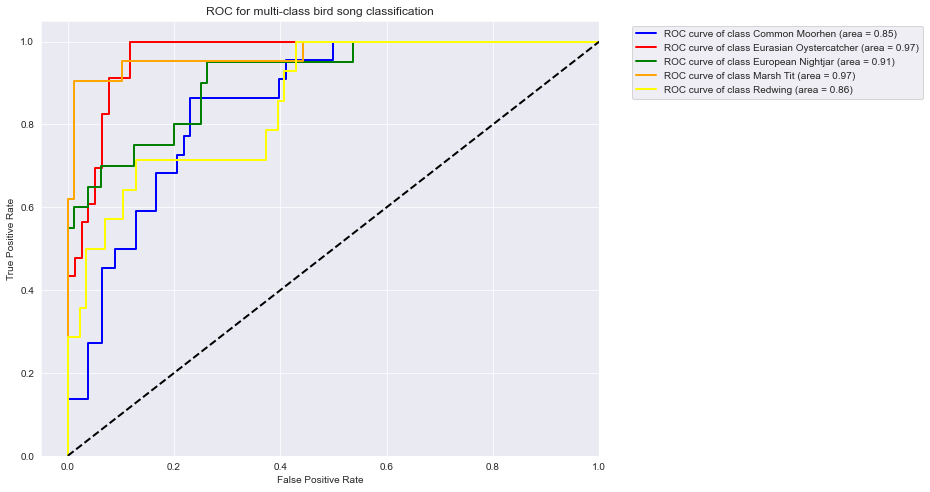

In [98]:
fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes = len(categories)
lw = 2
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(onehot_data[:, i], pred_df_softmax.to_numpy()[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = cycle(['blue', 'red', 'green', 'orange', 'yellow'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(categories[i], roc_auc[i]))
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC for multi-class bird song classification')
#plt.legend(loc="lower right")
plt.legend(bbox_to_anchor=(1.05, 1))#, loc='upper right')
plt.show()

In [99]:
for i in range(n_classes):
    print('AUC of {0}: \t{1:0.2f})'.format(categories[i], roc_auc[i]))

AUC of Common Moorhen: 	0.85)
AUC of Eurasian Oystercatcher: 	0.97)
AUC of European Nightjar: 	0.91)
AUC of Marsh Tit: 	0.97)
AUC of Redwing: 	0.86)


In [100]:
fig = go.Figure()
#colors = cycle(['blue', 'red', 'green', 'orange', 'yellow'])
for i in range(n_classes):
    fig.add_trace(go.Scatter(x = fpr[i], y = tpr[i], 
                             mode = 'lines', 
                             name = 'ROC curve of class {0} (area = {1:0.2f})'.format(categories[i], roc_auc[i])))
fig.update_layout(title       = 'ROC for multi-class bird song classification',
                  xaxis_title = 'False Positive Rate',
                  yaxis_title = 'True Positive Rate')

fig.show()